In [2]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
import numpy as np
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import accuracy_score
from sklearn.ensemble import RandomForestClassifier
from sklearn import *
from sklearn import linear_model,model_selection,metrics,neighbors
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

In [3]:
df = pd.read_csv('../Data/temp.csv')
df

,pcpnst,pdsist,phdist,sp01st,sp02st,sp06st,sp12st,sp24st,tmaxst,tminst,tmpcst,zndxst,fire count,State,Year,Month
0,6.12,-0.28,0.97,0.62,0.46,-0.26,0.88,0.65,54.3,33.9,44.1,1.01,9.0,1,1992,1
1,5.99,-0.10,1.02,0.48,0.71,0.08,1.00,0.40,63.5,39.3,51.4,0.46,27.0,1,1992,2
2,4.03,-0.70,-0.70,-0.77,-0.31,-0.24,0.59,-0.06,67.8,42.0,54.9,-1.84,14.0,1,1992,3
3,2.91,-1.12,-1.12,-0.83,-1.18,-0.20,0.09,-0.11,74.5,48.5,61.5,-1.49,18.0,1,1992,4
4,1.95,-1.60,-1.60,-1.31,-1.57,-0.71,-0.96,-0.41,81.0,55.0,68.0,-1.77,10.0,1,1992,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13531,4.00,1.29,1.29,0.22,-0.02,0.02,-0.06,0.70,76.3,55.9,66.1,0.42,45.0,47,2015,8
13532,4.39,1.23,1.23,0.52,0.50,0.58,0.12,1.07,75.2,54.1,64.7,0.21,20.0,47,2015,9
13533,2.70,1.32,1.32,0.22,0.46,0.56,0.01,0.99,59.0,37.9,48.4,0.65,48.0,47,2015,10
13534,3.42,1.93,1.93,1.37,1.09,0.68,0.30,1.12,48.2,30.5,39.4,2.25,24.0,47,2015,11


In [4]:
import mapclassify as mc
bp = mc.BoxPlot(df['fire count'])
bp

BoxPlot

     Interval        Count
--------------------------
(   -inf, -204.00] |     0
(-204.00,    3.00] |  3546
(   3.00,   29.00] |  3232
(  29.00,  141.00] |  3380
( 141.00,  348.00] |  1829
( 348.00, 3612.00] |  1549

In [5]:
scheme = mc.BoxPlot(df['fire count'])
num_classes = 5  # You can adjust this based on your preference

# Classify the data into bins
bins  = scheme.bins.tolist()
df['fire rate'] = pd.cut(df['fire count'], bins=bins, labels=False, include_lowest=True)
df

,pcpnst,pdsist,phdist,sp01st,sp02st,sp06st,sp12st,sp24st,tmaxst,tminst,tmpcst,zndxst,fire count,State,Year,Month,fire rate
0,6.12,-0.28,0.97,0.62,0.46,-0.26,0.88,0.65,54.3,33.9,44.1,1.01,9.0,1,1992,1,1
1,5.99,-0.10,1.02,0.48,0.71,0.08,1.00,0.40,63.5,39.3,51.4,0.46,27.0,1,1992,2,1
2,4.03,-0.70,-0.70,-0.77,-0.31,-0.24,0.59,-0.06,67.8,42.0,54.9,-1.84,14.0,1,1992,3,1
3,2.91,-1.12,-1.12,-0.83,-1.18,-0.20,0.09,-0.11,74.5,48.5,61.5,-1.49,18.0,1,1992,4,1
4,1.95,-1.60,-1.60,-1.31,-1.57,-0.71,-0.96,-0.41,81.0,55.0,68.0,-1.77,10.0,1,1992,5,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13531,4.00,1.29,1.29,0.22,-0.02,0.02,-0.06,0.70,76.3,55.9,66.1,0.42,45.0,47,2015,8,2
13532,4.39,1.23,1.23,0.52,0.50,0.58,0.12,1.07,75.2,54.1,64.7,0.21,20.0,47,2015,9,1
13533,2.70,1.32,1.32,0.22,0.46,0.56,0.01,0.99,59.0,37.9,48.4,0.65,48.0,47,2015,10,2
13534,3.42,1.93,1.93,1.37,1.09,0.68,0.30,1.12,48.2,30.5,39.4,2.25,24.0,47,2015,11,1


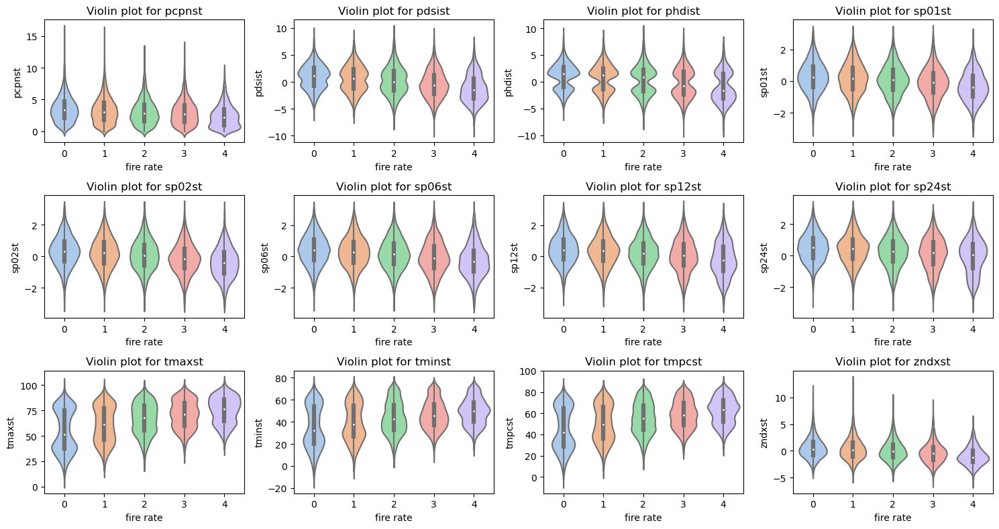

In [6]:
import seaborn as sns
fig, axs = plt.subplots(3, 4, figsize=(15, 8))
for i, ax in enumerate(axs.flatten()):
    sns.violinplot(x='fire rate', y=df.columns[i], data=df, palette='pastel', ax=ax)
    ax.set_title(f'Violin plot for '+df.columns[i])
    ax.set_xlabel('fire rate')
    ax.set_ylabel(df.columns[i])

plt.tight_layout()
plt.show()

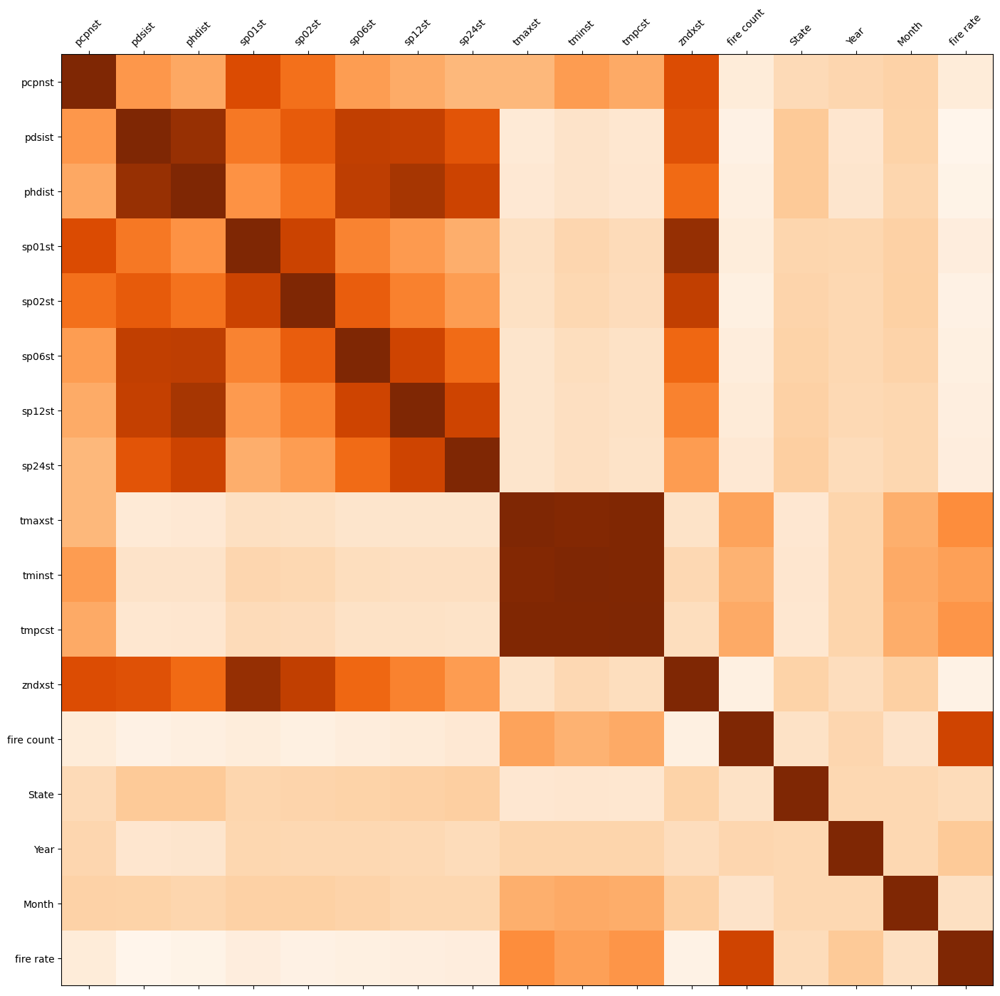

In [7]:
size = len(df.columns)
corr = df.corr()
fig, ax = plt.subplots(figsize=(size, size))
ax.matshow(corr,cmap=plt.cm.Oranges)
plt.xticks(range(len(corr.columns)), corr.columns)
plt.yticks(range(len(corr.columns)), corr.columns)
for tick in ax.get_xticklabels():
    tick.set_rotation(45)    
plt.show()

<Figure size 1000x800 with 0 Axes>

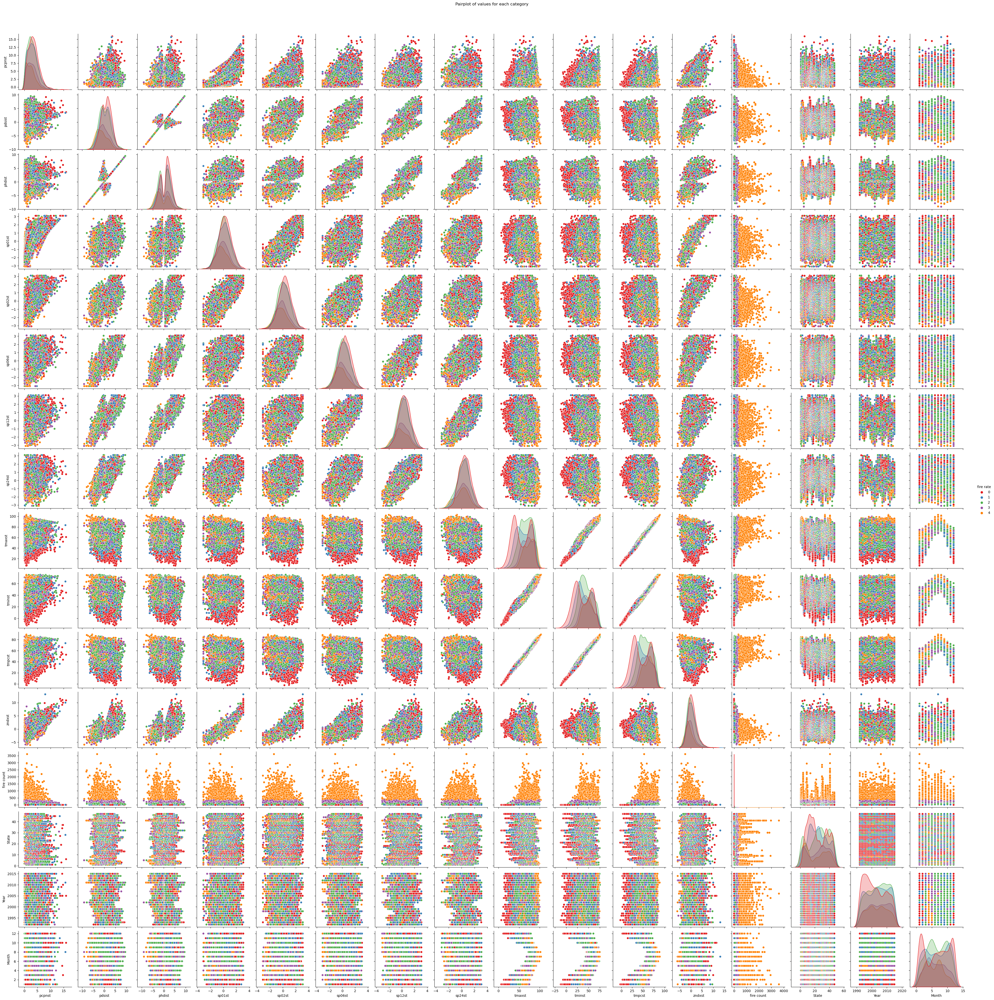

In [8]:
plt.figure(figsize=(10, 8))
sns.pairplot(df, hue='fire rate', palette='Set1')
plt.suptitle('Pairplot of values for each category', y=1.02)
plt.show()

In [9]:
y = df["fire rate"].values
X = df.drop(['fire count', 'State','Year', 'Month','fire rate'], axis=1).values

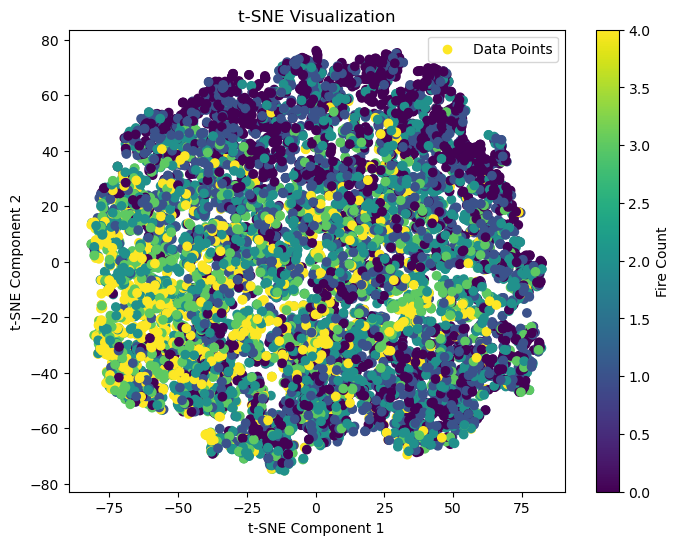

In [10]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

# Standardize the features
sc = StandardScaler()
X_train_std = sc.fit_transform(X_train)
X_test_std = sc.transform(X_test)

# Perform t-SNE
tsne = TSNE(n_components=2, random_state=0)
X_train_tsne = tsne.fit_transform(X_train_std)

# Logistic Regression on t-SNE transformed data
classifier = LogisticRegression(random_state=0)
classifier.fit(X_train_tsne, y_train)

# Apply the same transformation to the test set
X_test_tsne = tsne.fit_transform(X_test_std)

# Predict using the Logistic Regression model
y_pred = classifier.predict(X_test_tsne)

# Confusion Matrix
cm = confusion_matrix(y_test, y_pred)

# Plot t-SNE visualization
plt.figure(figsize=(8, 6))
scatter = plt.scatter(X_train_tsne[:, 0], X_train_tsne[:, 1], c=y_train, cmap='viridis', marker='o', label='Data Points')

plt.title('t-SNE Visualization')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.legend()
plt.colorbar(scatter, label='Fire Count')
plt.show()

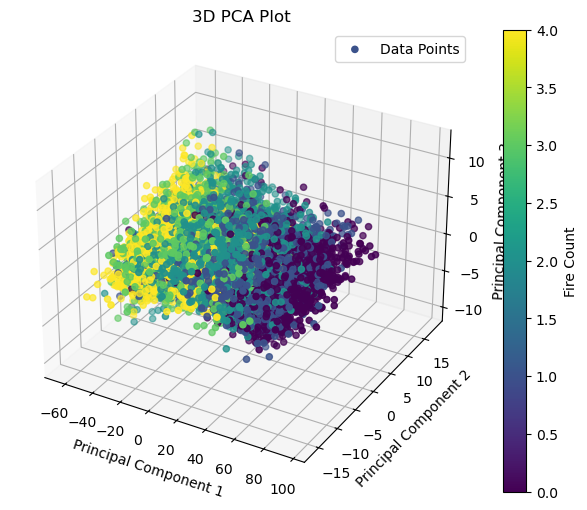

In [11]:
# Perform PCA
pca = PCA(n_components=3)
pca_result = pca.fit_transform(X)

# Create a 3D scatter plot
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')

# Plot the points
scatter = ax.scatter(pca_result[:, 0], pca_result[:, 1], pca_result[:, 2], c=y, cmap='viridis', marker='o', label='Data Points')

# Set labels for each axis
ax.set_xlabel('Principal Component 1')
ax.set_ylabel('Principal Component 2')
ax.set_zlabel('Principal Component 3')

# Set the title of the plot
ax.set_title('3D PCA Plot')

# Add a colorbar to show the mapping of colors to labels
cbar = fig.colorbar(scatter, ax=ax, label='Fire Count')

# Show the plot
plt.legend()
plt.show()

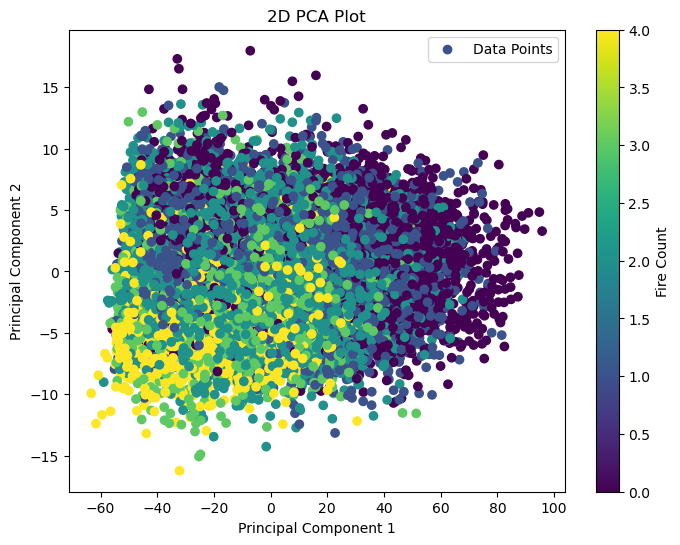

In [12]:

# Perform PCA with 2 components
pca = PCA(n_components=2)
pca_result = pca.fit_transform(X)

# Create a 2D scatter plot
plt.figure(figsize=(8, 6))

# Plot the points
scatter = plt.scatter(pca_result[:, 0], pca_result[:, 1], c=y, cmap='viridis', marker='o', label='Data Points')

# Set labels for the axes
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')

# Set the title of the plot
plt.title('2D PCA Plot')

# Add a colorbar to show the mapping of colors to labels
cbar = plt.colorbar(scatter, label='Fire Count')

# Show the plot
plt.legend()
plt.show()